In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('data.csv')

In [3]:

df.head(15)

,R_fighter,B_fighter,Referee,date,location,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,...,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age
0,Henry Cejudo,Marlon Moraes,Marc Goddard,2019-06-08,"Chicago, Illinois, USA",Red,True,Bantamweight,5,0.0,...,2.0,0.0,0.0,8.0,Orthodox,162.56,162.56,135.0,31.0,32.0
1,Valentina Shevchenko,Jessica Eye,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,True,Women's Flyweight,5,0.0,...,0.0,2.0,0.0,5.0,Southpaw,165.10,167.64,125.0,32.0,31.0
2,Tony Ferguson,Donald Cerrone,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Red,False,Lightweight,3,0.0,...,3.0,6.0,1.0,14.0,Orthodox,180.34,193.04,155.0,36.0,35.0
3,Jimmie Rivera,Petr Yan,Kevin MacDonald,2019-06-08,"Chicago, Illinois, USA",Blue,False,Bantamweight,3,0.0,...,1.0,0.0,0.0,6.0,Orthodox,162.56,172.72,135.0,26.0,29.0
4,Tai Tuivasa,Blagoy Ivanov,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Blue,False,Heavyweight,3,0.0,...,2.0,0.0,0.0,3.0,Southpaw,187.96,190.50,264.0,32.0,26.0
5,Tatiana Suarez,Nina Ansaroff,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,False,Women's Strawweight,3,0.0,...,1.0,2.0,0.0,4.0,NaN,165.10,167.64,115.0,33.0,28.0
6,Aljamain Sterling,Pedro Munhoz,Marc Goddard,2019-06-08,"Chicago, Illinois, USA",Red,False,Bantamweight,3,0.0,...,1.0,3.0,0.0,9.0,Orthodox,170.18,180.34,135.0,32.0,29.0
7,Karolina Kowalkiewicz,Alexa Grasso,Kevin MacDonald,2019-06-08,"Chicago, Illinois, USA",Blue,False,Women's Strawweight,3,1.0,...,0.0,0.0,0.0,5.0,Orthodox,160.02,162.56,115.0,25.0,33.0
8,Ricardo Lamas,Calvin Kattar,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Blue,False,Featherweight,3,0.0,...,4.0,3.0,0.0,10.0,Orthodox,172.72,180.34,145.0,31.0,37.0
9,Yan Xiaonan,Angela Hill,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,False,Women's Strawweight,3,0.0,...,0.0,0.0,0.0,3.0,Orthodox,165.10,160.02,115.0,34.0,29.0


In [4]:
df.shape

(5144, 145)

In [5]:
R_fighter_names = list(df.R_fighter.unique())
B_fighter_names = list(df.B_fighter.unique())

In [6]:
print(len(R_fighter_names))
print(len(B_fighter_names))

1334
1774


In [7]:
fighter_names = R_fighter_names + B_fighter_names
fighter_names = list(set(fighter_names))
len(fighter_names)

1915

In [8]:
column_names = list(df.columns)

In [9]:
null_values = df.isnull().sum()
pd.set_option('display.max_rows', null_values.shape[0]+1)

null_values

R_fighter                          0
B_fighter                          0
Referee                           23
date                               0
location                           0
Winner                             0
title_bout                         0
weight_class                       0
no_of_rounds                       0
B_current_lose_streak              0
B_current_win_streak               0
B_draw                             0
B_avg_BODY_att                  1265
B_avg_BODY_landed               1265
B_avg_CLINCH_att                1265
B_avg_CLINCH_landed             1265
B_avg_DISTANCE_att              1265
B_avg_DISTANCE_landed           1265
B_avg_GROUND_att                1265
B_avg_GROUND_landed             1265
B_avg_HEAD_att                  1265
B_avg_HEAD_landed               1265
B_avg_KD                        1265
B_avg_LEG_att                   1265
B_avg_LEG_landed                1265
B_avg_PASS                      1265
B_avg_REV                       1265
B

In [10]:
df[['B_Stance', 'R_Stance']] = df[['B_Stance', 'R_Stance']].fillna('Orthodox')
df[['R_Height_cms', 'R_Reach_cms', 'R_age', 'B_age', 'B_Height_cms', 'B_Reach_cms']] = df[['R_Height_cms', 'R_Reach_cms', 'R_age', 'B_age', 'B_Height_cms', 'B_Reach_cms']].fillna(df[['R_Height_cms', 'R_Reach_cms', 'R_age', 'B_age', 'B_Height_cms', 'B_Reach_cms']].mean())

In [11]:
null_values = df.isnull().sum()
pd.set_option('display.max_rows', null_values.shape[0]+1)

null_values

R_fighter                          0
B_fighter                          0
Referee                           23
date                               0
location                           0
Winner                             0
title_bout                         0
weight_class                       0
no_of_rounds                       0
B_current_lose_streak              0
B_current_win_streak               0
B_draw                             0
B_avg_BODY_att                  1265
B_avg_BODY_landed               1265
B_avg_CLINCH_att                1265
B_avg_CLINCH_landed             1265
B_avg_DISTANCE_att              1265
B_avg_DISTANCE_landed           1265
B_avg_GROUND_att                1265
B_avg_GROUND_landed             1265
B_avg_HEAD_att                  1265
B_avg_HEAD_landed               1265
B_avg_KD                        1265
B_avg_LEG_att                   1265
B_avg_LEG_landed                1265
B_avg_PASS                      1265
B_avg_REV                       1265
B

In [12]:
described_df = df.describe().T

In [13]:
pd.set_option('display.max_rows', described_df.shape[0]+1)
print(described_df)

                               count        mean         std    min  \
no_of_rounds                  5144.0    3.119362    0.631457    1.0   
B_current_lose_streak         5144.0    0.429821    0.731325    0.0   
B_current_win_streak          5144.0    0.837286    1.306203    0.0   
B_draw                        5144.0    0.000000    0.000000    0.0   
B_avg_BODY_att                3879.0    8.689387    7.087703    0.0   
B_avg_BODY_landed             3879.0    6.083457    5.074464    0.0   
B_avg_CLINCH_att              3879.0    8.240461    7.575422    0.0   
B_avg_CLINCH_landed           3879.0    5.556352    5.429531    0.0   
B_avg_DISTANCE_att            3879.0   53.156807   41.252426    0.0   
B_avg_DISTANCE_landed         3879.0   19.329445   15.961112    0.0   
B_avg_GROUND_att              3879.0    8.753818    8.756889    0.0   
B_avg_GROUND_landed           3879.0    5.772840    5.733290    0.0   
B_avg_HEAD_att                3879.0   55.453012   36.335929    0.0   
B_avg_

In [14]:
df.info(object)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5144 entries, 0 to 5143
Data columns (total 145 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   R_fighter                     object 
 1   B_fighter                     object 
 2   Referee                       object 
 3   date                          object 
 4   location                      object 
 5   Winner                        object 
 6   title_bout                    bool   
 7   weight_class                  object 
 8   no_of_rounds                  int64  
 9   B_current_lose_streak         float64
 10  B_current_win_streak          float64
 11  B_draw                        float64
 12  B_avg_BODY_att                float64
 13  B_avg_BODY_landed             float64
 14  B_avg_CLINCH_att              float64
 15  B_avg_CLINCH_landed           float64
 16  B_avg_DISTANCE_att            float64
 17  B_avg_DISTANCE_landed         float64
 18  B_avg_GROUND_att           

In [15]:
# Columns offer nothing to our model we want to make.
df.drop(['Referee', 'location'], axis=1, inplace=True)

In [16]:
df['date'] = pd.to_datetime(df['date'])

In [17]:
df['B_Stance'].unique()

array(['Orthodox', 'Switch', 'Southpaw', 'Open Stance', 'Sideways'],
      dtype=object)

In [18]:
df = df[df.Winner != 'Draw']

In [19]:
df['Winner'].unique()

array(['Red', 'Blue'], dtype=object)

In [20]:
stance_numbered = {"Orthodox":0,
"Southpaw":1,
'Switch':2,
'Open Stance':3,
'Sideways':4
}

In [21]:
df['R_stance'] = np.nan
df['B_stance'] = np.nan

In [22]:
df["R_stance"] = df["R_Stance"].apply(lambda x: stance_numbered.get(x))
df["B_stance"] = df["B_Stance"].apply(lambda x: stance_numbered.get(x))

In [23]:
df.drop(['R_Stance', 'B_Stance'], axis=1, inplace=True)

In [24]:
#Unified Rules of Mixed Martial Arts was made april of 2001 which means fights before the dropped date were no holds barred fights
df = df[df['date'] > '2001-04-01']

In [25]:
df = df.dropna()
df = df.reset_index(drop=True)

In [26]:
null_values = df.isnull().sum()
pd.set_option('display.max_rows', null_values.shape[0]+1)

null_values

R_fighter                       0
B_fighter                       0
date                            0
Winner                          0
title_bout                      0
weight_class                    0
no_of_rounds                    0
B_current_lose_streak           0
B_current_win_streak            0
B_draw                          0
B_avg_BODY_att                  0
B_avg_BODY_landed               0
B_avg_CLINCH_att                0
B_avg_CLINCH_landed             0
B_avg_DISTANCE_att              0
B_avg_DISTANCE_landed           0
B_avg_GROUND_att                0
B_avg_GROUND_landed             0
B_avg_HEAD_att                  0
B_avg_HEAD_landed               0
B_avg_KD                        0
B_avg_LEG_att                   0
B_avg_LEG_landed                0
B_avg_PASS                      0
B_avg_REV                       0
B_avg_SIG_STR_att               0
B_avg_SIG_STR_landed            0
B_avg_SIG_STR_pct               0
B_avg_SUB_ATT                   0
B_avg_TD_att  

In [27]:
df.shape

(3496, 143)

In [28]:
df.info(object)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3496 entries, 0 to 3495
Data columns (total 143 columns):
 #   Column                        Dtype         
---  ------                        -----         
 0   R_fighter                     object        
 1   B_fighter                     object        
 2   date                          datetime64[ns]
 3   Winner                        object        
 4   title_bout                    bool          
 5   weight_class                  object        
 6   no_of_rounds                  int64         
 7   B_current_lose_streak         float64       
 8   B_current_win_streak          float64       
 9   B_draw                        float64       
 10  B_avg_BODY_att                float64       
 11  B_avg_BODY_landed             float64       
 12  B_avg_CLINCH_att              float64       
 13  B_avg_CLINCH_landed           float64       
 14  B_avg_DISTANCE_att            float64       
 15  B_avg_DISTANCE_landed         float64

In [29]:
df.R_fighter.value_counts()

Michael Bisping      20
Demian Maia          19
Donald Cerrone       19
Jim Miller           19
Anderson Silva       18
                     ..
Valmir Lazaro         1
Joby Sanchez          1
Jonavin Webb          1
Alex Morono           1
Houston Alexander     1
Name: R_fighter, Length: 959, dtype: int64

In [30]:
df.B_fighter.value_counts()

Jeremy Stephens     17
Charles Oliveira    15
Nik Lentz           13
Rafael Dos Anjos    12
Nate Marquardt      11
                    ..
Sijara Eubanks       1
Chris Wilson         1
Craig White          1
Jesse Taylor         1
Jared Papazian       1
Name: B_fighter, Length: 1252, dtype: int64

In [31]:
df['weight_class'].unique()

array(['Bantamweight', "Women's Flyweight", 'Lightweight', 'Heavyweight',
       "Women's Strawweight", 'Featherweight', 'Middleweight',
       'Light Heavyweight', "Women's Bantamweight", 'Welterweight',
       'Flyweight', "Women's Featherweight", 'Catch Weight'], dtype=object)

In [32]:
df["weight_class"] = df["weight_class"].astype('category')

In [33]:
df["weight_class"] = df["weight_class"].cat.codes

In [34]:
red_winner = {'Red':1, 'Blue':0}
df['Winner'] = df["Winner"].apply(lambda x: red_winner.get(x))

In [35]:
pd.set_option('display.max_columns', None)
df.head()

,R_fighter,B_fighter,date,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_draw,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_KD,B_avg_LEG_att,B_avg_LEG_landed,B_avg_PASS,B_avg_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_SIG_STR_pct,B_avg_SUB_ATT,B_avg_TD_att,B_avg_TD_landed,B_avg_TD_pct,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_longest_win_streak,B_losses,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_opp_KD,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_opp_PASS,B_avg_opp_REV,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_opp_SIG_STR_pct,B_avg_opp_SUB_ATT,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_opp_TD_pct,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_total_rounds_fought,B_total_time_fought(seconds),B_total_title_bouts,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_wins,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_current_lose_streak,R_current_win_streak,R_draw,R_avg_BODY_att,R_avg_BODY_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_KD,R_avg_LEG_att,R_avg_LEG_landed,R_avg_PASS,R_avg_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_SIG_STR_pct,R_avg_SUB_ATT,R_avg_TD_att,R_avg_TD_landed,R_avg_TD_pct,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_longest_win_streak,R_losses,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_opp_KD,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_opp_PASS,R_avg_opp_REV,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_opp_SIG_STR_pct,R_avg_opp_SUB_ATT,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_opp_TD_pct,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_total_rounds_fought,R_total_time_fought(seconds),R_total_title_bouts,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age,R_stance,B_stance
0,Henry Cejudo,Marlon Moraes,2019-06-08,1,True,0,5,0.0,4.0,0.0,9.200000,6.000000,0.200000,0.000000,62.600000,20.600000,2.600000,2.000000,48.600000,11.200000,0.800000,7.6,5.400000,0.400000,0.000000,65.40,22.600000,0.466000,0.400000,0.80000,0.200000,0.100000,66.400000,23.600000,4.0,1.0,6.400000,4.000000,1.000000,0.60000,51.200000,17.400000,0.600000,0.200000,39.600000,9.400000,0.200000,6.80000,4.800000,0.000000,0.000000,52.800000,18.20000,0.236000,0.000000,1.000000,0.400000,0.100000,53.800000,19.200000,9.0,419.400000,0.0,0.0,1.0,0.0,2.0,1.0,0.0,4.0,167.64,170.18,135.0,0.0,4.0,0.0,21.900000,16.400000,17.000000,11.000000,75.000000,26.500000,9.400000,6.500000,74.200000,23.90,0.400,5.300000,3.700000,1.200000,0.000000,101.400000,44.000000,0.466000,0.100000,5.300000,1.900000,0.458000,129.900000,69.100000,4.0,2.0,13.300000,8.800000,7.500000,5.100000,90.500000,26.800000,0.800000,0.300000,76.100000,17.300000,0.100000,9.400000,6.100000,0.000000,0.000000,98.800000,32.200000,0.336000,0.000000,0.900000,0.100000,0.050000,110.500000,43.300000,27.0,742.60,3.0,0.0,2.0,4.0,2.0,0.0,0.0,8.0,162.56,162.56,135.0,31.0,32.0,0,0
1,Valentina Shevchenko,Jessica Eye,2019-06-08,1,True,11,5,0.0,3.0,0.0,14.600000,9.100000,11.800000,7.300000,124.700000,42.100000,2.400000,1.900000,112.000000,32.000000,0.000000,12.3,10.200000,0.800000,0.000000,138.90,51.300000,0.399000,0.700000,1.00000,0.500000,0.225000,158.700000,69.600000,3.0,6.0,13.000000,9.30000

In [36]:
print(column_names)

['R_fighter', 'B_fighter', 'Referee', 'date', 'location', 'Winner', 'title_bout', 'weight_class', 'no_of_rounds', 'B_current_lose_streak', 'B_current_win_streak', 'B_draw', 'B_avg_BODY_att', 'B_avg_BODY_landed', 'B_avg_CLINCH_att', 'B_avg_CLINCH_landed', 'B_avg_DISTANCE_att', 'B_avg_DISTANCE_landed', 'B_avg_GROUND_att', 'B_avg_GROUND_landed', 'B_avg_HEAD_att', 'B_avg_HEAD_landed', 'B_avg_KD', 'B_avg_LEG_att', 'B_avg_LEG_landed', 'B_avg_PASS', 'B_avg_REV', 'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed', 'B_avg_SIG_STR_pct', 'B_avg_SUB_ATT', 'B_avg_TD_att', 'B_avg_TD_landed', 'B_avg_TD_pct', 'B_avg_TOTAL_STR_att', 'B_avg_TOTAL_STR_landed', 'B_longest_win_streak', 'B_losses', 'B_avg_opp_BODY_att', 'B_avg_opp_BODY_landed', 'B_avg_opp_CLINCH_att', 'B_avg_opp_CLINCH_landed', 'B_avg_opp_DISTANCE_att', 'B_avg_opp_DISTANCE_landed', 'B_avg_opp_GROUND_att', 'B_avg_opp_GROUND_landed', 'B_avg_opp_HEAD_att', 'B_avg_opp_HEAD_landed', 'B_avg_opp_KD', 'B_avg_opp_LEG_att', 'B_avg_opp_LEG_landed', 'B_avg_op

In [37]:
b_fighter_cols = ['B_avg_BODY_att', 'B_avg_BODY_landed', 'B_avg_CLINCH_att', 
'B_avg_CLINCH_landed', 'B_avg_DISTANCE_att', 'B_avg_DISTANCE_landed', 
'B_avg_GROUND_att', 'B_avg_GROUND_landed', 'B_avg_HEAD_att', 'B_avg_HEAD_landed', 
'B_avg_KD', 'B_avg_LEG_att', 'B_avg_LEG_landed', 'B_avg_PASS', 'B_avg_REV', 
'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed', 'B_avg_SIG_STR_pct', 'B_avg_SUB_ATT', 
'B_avg_TD_att', 'B_avg_TD_landed', 'B_avg_TD_pct', 'B_avg_TOTAL_STR_att', 
'B_avg_TOTAL_STR_landed', 'B_longest_win_streak', 'B_losses', 'B_avg_opp_BODY_att', 
'B_avg_opp_BODY_landed', 'B_avg_opp_CLINCH_att', 'B_avg_opp_CLINCH_landed', 
'B_avg_opp_DISTANCE_att', 'B_avg_opp_DISTANCE_landed', 'B_avg_opp_GROUND_att', 
'B_avg_opp_GROUND_landed', 'B_avg_opp_HEAD_att', 'B_avg_opp_HEAD_landed', 
'B_avg_opp_KD', 'B_avg_opp_LEG_att', 'B_avg_opp_LEG_landed', 'B_avg_opp_PASS', 
'B_avg_opp_REV', 'B_avg_opp_SIG_STR_att', 'B_avg_opp_SIG_STR_landed', 
'B_avg_opp_SIG_STR_pct', 'B_avg_opp_SUB_ATT', 'B_avg_opp_TD_att', 'B_avg_opp_TD_landed', 
'B_avg_opp_TD_pct', 'B_avg_opp_TOTAL_STR_att', 'B_avg_opp_TOTAL_STR_landed', 
'B_total_rounds_fought', 'B_total_time_fought(seconds)']


In [38]:
b_fighter_dict = {}
for name in fighter_names:
        b_fighter_dict[name] = df.loc[df['B_fighter'] == name, ['B_avg_BODY_att', 'B_avg_BODY_landed', 'B_avg_CLINCH_att', 
'B_avg_CLINCH_landed', 'B_avg_DISTANCE_att', 'B_avg_DISTANCE_landed', 
'B_avg_GROUND_att', 'B_avg_GROUND_landed', 'B_avg_HEAD_att', 'B_avg_HEAD_landed', 
'B_avg_KD', 'B_avg_LEG_att', 'B_avg_LEG_landed', 'B_avg_PASS', 'B_avg_REV', 
'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed', 'B_avg_SIG_STR_pct', 'B_avg_SUB_ATT', 
'B_avg_TD_att', 'B_avg_TD_landed', 'B_avg_TD_pct', 'B_avg_TOTAL_STR_att', 
'B_avg_TOTAL_STR_landed', 'B_longest_win_streak', 'B_losses', 'B_avg_opp_BODY_att', 
'B_avg_opp_BODY_landed', 'B_avg_opp_CLINCH_att', 'B_avg_opp_CLINCH_landed', 
'B_avg_opp_DISTANCE_att', 'B_avg_opp_DISTANCE_landed', 'B_avg_opp_GROUND_att', 
'B_avg_opp_GROUND_landed', 'B_avg_opp_HEAD_att', 'B_avg_opp_HEAD_landed', 
'B_avg_opp_KD', 'B_avg_opp_LEG_att', 'B_avg_opp_LEG_landed', 'B_avg_opp_PASS', 
'B_avg_opp_REV', 'B_avg_opp_SIG_STR_att', 'B_avg_opp_SIG_STR_landed', 
'B_avg_opp_SIG_STR_pct', 'B_avg_opp_SUB_ATT', 'B_avg_opp_TD_att', 'B_avg_opp_TD_landed', 
'B_avg_opp_TD_pct', 'B_avg_opp_TOTAL_STR_att', 'B_avg_opp_TOTAL_STR_landed', 
'B_total_rounds_fought', 'B_total_time_fought(seconds)']].mean()


In [39]:
b_fighter_stats = pd.DataFrame.from_dict(b_fighter_dict, orient='index', columns=b_fighter_cols)
b_fighter_stats.head()

,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_KD,B_avg_LEG_att,B_avg_LEG_landed,B_avg_PASS,B_avg_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_SIG_STR_pct,B_avg_SUB_ATT,B_avg_TD_att,B_avg_TD_landed,B_avg_TD_pct,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_longest_win_streak,B_losses,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_opp_KD,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_opp_PASS,B_avg_opp_REV,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_opp_SIG_STR_pct,B_avg_opp_SUB_ATT,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_opp_TD_pct,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_total_rounds_fought,B_total_time_fought(seconds)
Wendell Oliveira,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alex White,23.786508,14.865079,12.537302,7.427778,86.853175,30.034127,3.182937,2.810317,75.033730,22.194048,0.503571,3.753175,3.213095,0.435317,0.267063,102.573413,40.272222,0.464611,0.182143,1.456349,0.585714,0.137083,113.578968,49.995238,1.0,2.333333,12.905556,6.567460,5.746032,3.543651,81.476190,24.726984,4.399206,2.687302,69.891270,18.582540,0.364286,8.824603,5.807937,0.434921,0.023810,91.621429,30.957937,0.372294,0.411905,2.070635,0.787698,0.143738,100.940476,38.621032,10.666667,568.723810
Shonie Carter,6.500000,4.861111,4.805556,4.277778,22.638889,9.416667,8.666667,3.972222,21.055556,6.500000,0.722222,8.555556,6.305556,1.444444,1.083333,36.111111,17.666667,0.483611,0.000000,3.250000,2.527778,0.538056,61.416667,41.972222,2.0,1.000000,2.055556,1.972222,3.888889,2.722222,21.722222,7.527778,1.666667,1.222222,21.777778,7.666667,0.361111,3.444444,1.833333,2.555556,0.722222,27.277778,11.472222,0.440278,1.444444,5.611111,0.916667,0.248611,61.333333,43.888889,6.666667,641.333333
Paulo Costa,14.750000,12.583333,10.666667,6.750000,39.416667,20.416667,11.583333,8.083333,45.750000,21.666667,0.583333,1.166667,1.000000,0.000000,0.000000,61.666667,35.250000,0.594167,0.000000,0.416667,0.000000,0.000000,65.416667,38.583333,2.5,0.000000,11.583333,8.666667,8.250000,6.250000,32.416667,14.500000,0.000000,0.000000,23.666667,7.500000,0.000000,5.416667,4.583333,0.416667,0.000000,40.666667,20.750000,0.479167,0.000000,3.166667,0.833333,0.166667,43.583333,23.666667,4.000000,248.416667
Sean Spencer,15.247619,8.567143,12.274762,7.078095,155.249048,46.484286,1.781429,1.527143,149.622857,42.772381,0.192381,4.434762,3.750000,0.509524,0.151905,169.305238,55.089524,0.281871,0.000000,0.355714,0.101905,0.050952,175.900952,61.554762,1.6,2.400000,13.073333,7.790476,11.147619,6.510952,114.300952,40.440000,17.728095,13.429524,117.239524,40.030476,0.151905,12.863810,12.559524,2.049048,0.130476,143.176667,60.380476,0.440429,1.407619,8.087143,3.050952,0.390467,168.781429,84.366190,13.800000,840.231905


In [40]:
r_fighter_cols =  ['R_avg_BODY_att', 'R_avg_BODY_landed',
       'R_avg_CLINCH_att', 'R_avg_CLINCH_landed', 'R_avg_DISTANCE_att',
       'R_avg_DISTANCE_landed', 'R_avg_GROUND_att', 'R_avg_GROUND_landed',
       'R_avg_HEAD_att', 'R_avg_HEAD_landed', 'R_avg_KD', 'R_avg_LEG_att',
       'R_avg_LEG_landed', 'R_avg_PASS', 'R_avg_REV', 'R_avg_SIG_STR_att',
       'R_avg_SIG_STR_landed', 'R_avg_SIG_STR_pct', 'R_avg_SUB_ATT',
       'R_avg_TD_att', 'R_avg_TD_landed', 'R_avg_TD_pct',
       'R_avg_TOTAL_STR_att', 'R_avg_TOTAL_STR_landed', 'R_longest_win_streak',
       'R_losses', 'R_avg_opp_BODY_att', 'R_avg_opp_BODY_landed',
       'R_avg_opp_CLINCH_att', 'R_avg_opp_CLINCH_landed',
       'R_avg_opp_DISTANCE_att', 'R_avg_opp_DISTANCE_landed',
       'R_avg_opp_GROUND_att', 'R_avg_opp_GROUND_landed', 'R_avg_opp_HEAD_att',
       'R_avg_opp_HEAD_landed', 'R_avg_opp_KD', 'R_avg_opp_LEG_att',
       'R_avg_opp_LEG_landed', 'R_avg_opp_PASS', 'R_avg_opp_REV',
       'R_avg_opp_SIG_STR_att', 'R_avg_opp_SIG_STR_landed',
       'R_avg_opp_SIG_STR_pct', 'R_avg_opp_SUB_ATT', 'R_avg_opp_TD_att',
       'R_avg_opp_TD_landed', 'R_avg_opp_TD_pct', 'R_avg_opp_TOTAL_STR_att',
       'R_avg_opp_TOTAL_STR_landed', 'R_total_rounds_fought',
       'R_total_time_fought(seconds)']


In [41]:
r_fighter_dict = {}
for name in fighter_names:
        r_fighter_dict[name] = df.loc[df['R_fighter'] == name, ['R_avg_BODY_att', 'R_avg_BODY_landed',
       'R_avg_CLINCH_att', 'R_avg_CLINCH_landed', 'R_avg_DISTANCE_att',
       'R_avg_DISTANCE_landed', 'R_avg_GROUND_att', 'R_avg_GROUND_landed',
       'R_avg_HEAD_att', 'R_avg_HEAD_landed', 'R_avg_KD', 'R_avg_LEG_att',
       'R_avg_LEG_landed', 'R_avg_PASS', 'R_avg_REV', 'R_avg_SIG_STR_att',
       'R_avg_SIG_STR_landed', 'R_avg_SIG_STR_pct', 'R_avg_SUB_ATT',
       'R_avg_TD_att', 'R_avg_TD_landed', 'R_avg_TD_pct',
       'R_avg_TOTAL_STR_att', 'R_avg_TOTAL_STR_landed', 'R_longest_win_streak',
       'R_losses', 'R_avg_opp_BODY_att', 'R_avg_opp_BODY_landed',
       'R_avg_opp_CLINCH_att', 'R_avg_opp_CLINCH_landed',
       'R_avg_opp_DISTANCE_att', 'R_avg_opp_DISTANCE_landed',
       'R_avg_opp_GROUND_att', 'R_avg_opp_GROUND_landed', 'R_avg_opp_HEAD_att',
       'R_avg_opp_HEAD_landed', 'R_avg_opp_KD', 'R_avg_opp_LEG_att',
       'R_avg_opp_LEG_landed', 'R_avg_opp_PASS', 'R_avg_opp_REV',
       'R_avg_opp_SIG_STR_att', 'R_avg_opp_SIG_STR_landed',
       'R_avg_opp_SIG_STR_pct', 'R_avg_opp_SUB_ATT', 'R_avg_opp_TD_att',
       'R_avg_opp_TD_landed', 'R_avg_opp_TD_pct', 'R_avg_opp_TOTAL_STR_att',
       'R_avg_opp_TOTAL_STR_landed', 'R_total_rounds_fought',
       'R_total_time_fought(seconds)']].mean()


In [42]:
r_fighter_stats = pd.DataFrame.from_dict(r_fighter_dict, orient='index', columns=r_fighter_cols)

In [43]:
r_fighter_stats.head()

,R_avg_BODY_att,R_avg_BODY_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_KD,R_avg_LEG_att,R_avg_LEG_landed,R_avg_PASS,R_avg_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_SIG_STR_pct,R_avg_SUB_ATT,R_avg_TD_att,R_avg_TD_landed,R_avg_TD_pct,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_longest_win_streak,R_losses,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_opp_KD,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_opp_PASS,R_avg_opp_REV,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_opp_SIG_STR_pct,R_avg_opp_SUB_ATT,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_opp_TD_pct,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_total_rounds_fought,R_total_time_fought(seconds)
Wendell Oliveira,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alex White,22.875,13.625000,8.000000,5.125,86.375,27.812500,3.562500,3.000000,72.6875,20.312500,0.5,2.375000,2.0,0.1875,0.125,97.937500,35.9375,0.44,0.0625,0.687500,0.3125,0.109375,105.8125,42.750000,1.0,3.0,10.062500,5.750000,3.125000,1.937500,75.437500,25.750000,4.562500,3.312500,65.375000,19.875000,0.375,7.6875,5.375000,0.625000,0.0625,83.125000,31.000000,0.405625,0.312500,2.0,0.562500,0.137500,91.0,37.437500,11.5,521.562500
Shonie Carter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Paulo Costa,3.000,3.000000,0.000000,0.000,26.000,16.000000,6.000000,6.000000,28.0000,18.000000,1.0,1.000000,1.0,0.0000,0.000,32.000000,22.0000,0.68,0.0000,0.000000,0.0000,0.000000,33.0000,23.000000,1.0,0.0,4.000000,4.000000,3.000000,1.000000,11.000000,5.000000,0.000000,0.000000,10.000000,2.000000,0.000,0.0000,0.000000,0.000000,0.0000,14.000000,6.000000,0.420000,0.000000,1.0,0.000000,0.000000,14.0,6.000000,1.0,77.000000
Sean Spencer,17.000,11.333333,17.333333,11.000,194.000,60.666667,0.333333,0.333333,190.0000,56.666667,0.0,4.666667,4.0,0.0000,0.000,211.666667,72.0000,0.29,0.0000,0.333333,0.0000,0.000000,214.0000,74.333333,2.0,1.0,18.666667,10.333333,13.333333,7.333333,139.666667,44.666667,16.333333,12.666667,133.666667,37.666667,0.000,17.0000,16.666667,1.333333,0.0000,169.333333,64.666667,0.410000,1.333333,8.0,1.666667,0.266667,193.0,86.333333,9.0,844.333333


In [44]:
#Gonna use Donald Cerrone since one of most vetted fighters has a lot of data on him win and loss
df_cowboy_r = df.loc[df['R_fighter'] == 'Donald Cerrone']
df_cowboy_b = df.loc[df['B_fighter'] == 'Donald Cerrone']

In [45]:
'''df_cowboy_b = df_cowboy_b.rename(columns={'R_fighter':'Opponent',
 'B_fighter':'Cowboy','B_current_lose_streak':'c_current_lose_streak',
 'B_current_win_streak':'C_current_win_streak',
 'B_draw':'C_draw',
 'B_avg_BODY_att':'C_avg_BODY_att',
 'B_avg_BODY_landed':'C_avg_BODY_landed',
 'B_avg_CLINCH_att':'C_avg_CLINCH_att',
 'B_avg_CLINCH_landed':'C_avg_CLINCH_landed',
 'B_avg_DISTANCE_att':'C_avg_DISTANCE_att',
 'B_avg_DISTANCE_landed':'C_avg_DISTANCE_landed',
 'B_avg_GROUND_att':'C_avg_GROUND_att',
 'B_avg_GROUND_landed':'C_avg_GROUND_landed',
 'B_avg_HEAD_att':'C_avg_HEAD_att',
 'B_avg_HEAD_landed':'C_avg_HEAD_landed',
 'B_avg_KD':'C_avg_KD',
 'B_avg_LEG_att':'C_avg_LEG_att',
 'B_avg_LEG_landed':'C_avg_LEG_landed',
 'B_avg_PASS':'C_avg_PASS',
 'B_avg_REV':'C_avg_REV',
 'B_avg_SIG_STR_att':'C_avg_SIG_STR_att',
 'B_avg_SIG_STR_landed':'C_avg_SIG_STR_landed',
 'B_avg_SIG_STR_pct':'C_avg_SIG_STR_pct',
 'B_avg_SUB_ATT':'C_avg_SUB_ATT',
 'B_avg_TD_att':'C_avg_TD_att',
 'B_avg_TD_landed':'C_avg_TD_landed',
 'B_avg_TD_pct':'C_avg_TD_pct',
 'B_avg_TOTAL_STR_att':'C_avg_TOTAL_STR_att',
 'B_avg_TOTAL_STR_landed':'C_avg_TOTAL_STR_landed',
 'B_longest_win_streak':'C_longest_win_streak',
 'B_losses':'C_losses',
 'B_avg_opp_BODY_att':'C_avg_opp_BODY_att',
 'B_avg_opp_BODY_landed':'C_avg_opp_BODY_landed',
 'B_avg_opp_CLINCH_att':'C_avg_opp_CLINCH_att',
 'B_avg_opp_CLINCH_landed':'C_avg_opp_CLINCH_landed',
 'B_avg_opp_DISTANCE_att':'C_avg_opp_DISTANCE_att',
 'B_avg_opp_DISTANCE_landed':'C_avg_opp_DISTANCE_landed',
 'B_avg_opp_GROUND_att':'C_avg_opp_GROUND_att',
 'B_avg_opp_GROUND_landed':'C_avg_opp_GROUND_landed',
 'B_avg_opp_HEAD_att':'C_avg_opp_HEAD_att',
 'B_avg_opp_HEAD_landed':'C_avg_opp_HEAD_landed',
 'B_avg_opp_KD':'C_avg_opp_KD',
 'B_avg_opp_LEG_att':'C_avg_opp_LEG_att',
 'B_avg_opp_LEG_landed':'C_avg_opp_LEG_landed',
 'B_avg_opp_PASS':'C_avg_opp_PASS',
 'B_avg_opp_REV':'C_avg_opp_REV',
 'B_avg_opp_SIG_STR_att':'C_avg_opp_SIG_STR_att',
 'B_avg_opp_SIG_STR_landed':'C_avg_opp_SIG_STR_landed',
 'B_avg_opp_SIG_STR_pct':'C_avg_opp_SIG_STR_pct',
 'B_avg_opp_SUB_ATT':'C_avg_opp_SUB_ATT',
 'B_avg_opp_TD_att':'C_avg_opp_TD_att',
 'B_avg_opp_TD_landed':'C_avg_opp_TD_landed',
 'B_avg_opp_TD_pct':'C_avg_opp_TD_pct',
 'B_avg_opp_TOTAL_STR_att':'C_avg_opp_TOTAL_STR_att',
 'B_avg_opp_TOTAL_STR_landed':'C_avg_opp_TOTAL_STR_landed',
 'B_total_rounds_fought':'C_total_rounds_fought',
 'B_total_time_fought(seconds)':'C_total_time_fought(seconds)',
 'B_total_title_bouts':'C_total_title_bouts',
 'B_win_by_Decision_Majority':'C_win_by_Decision_Majority',
 'B_win_by_Decision_Split':'C_win_by_Decision_Split',
 'B_win_by_Decision_Unanimous':'C_win_by_Decision_Unanimous',
 'B_win_by_KO/TKO':'C_win_by_KO/TKO',
 'B_win_by_Submission':'C_win_by_Submission',
 'B_win_by_TKO_Doctor_Stoppage':'C_win_by_TKO_Doctor_Stoppage',
 'B_wins':'C_wins',
 'B_Height_cms':'C_Height_cms',
 'B_Reach_cms':'C_Reach_cms',
 'B_Weight_lbs':'C_Weight_lbs',
 'R_current_lose_streak':'O_current_lose_streak',
 'R_current_win_streak':'O_current_win_streak',
 'R_draw':'O_draw',
 'R_avg_BODY_att':'O_avg_BODY_att',
 'R_avg_BODY_landed':'O_avg_BODY_landed',
 'R_avg_CLINCH_att':'O_avg_CLINCH_att',
 'R_avg_CLINCH_landed':'O_avg_CLINCH_landed',
 'R_avg_DISTANCE_att':'O_avg_DISTANCE_att',
 'R_avg_DISTANCE_landed':'O_avg_DISTANCE_landed',
 'R_avg_GROUND_att':'O_avg_GROUND_att',
 'R_avg_GROUND_landed':'O_avg_GROUND_landed',
 'R_avg_HEAD_att':'O_avg_HEAD_att',
 'R_avg_HEAD_landed':'O_avg_HEAD_landed',
 'R_avg_KD':'O_avg_KD',
 'R_avg_LEG_att':'O_avg_LEG_att',
 'R_avg_LEG_landed':'O_avg_LEG_landed',
 'R_avg_PASS':'O_avg_PASS',
 'R_avg_REV':'O_avg_REV',
 'R_avg_SIG_STR_att':'O_avg_SIG_STR_att',
 'R_avg_SIG_STR_landed':'O_avg_SIG_STR_landed',
 'R_avg_SIG_STR_pct':'O_avg_SIG_STR_pct',
 'R_avg_SUB_ATT':'O_avg_SUB_ATT',
 'R_avg_TD_att':'O_avg_TD_att',
 'R_avg_TD_landed':'O_avg_TD_landed',
 'R_avg_TD_pct':'O_avg_TD_pct',
 'R_avg_TOTAL_STR_att':'O_avg_TOTAL_STR_att',
 'R_avg_TOTAL_STR_landed':'O_avg_TOTAL_STR_landed',
 'R_longest_win_streak':'O_longest_win_streak',
 'R_losses':'O_losses',
 'R_avg_opp_BODY_att':'O_avg_opp_BODY_att',
 'R_avg_opp_BODY_landed':'O_avg_opp_BODY_landed',
 'R_avg_opp_CLINCH_att':'O_avg_opp_CLINCH_att',
 'R_avg_opp_CLINCH_landed':'O_avg_opp_CLINCH_landed',
 'R_avg_opp_DISTANCE_att':'O_avg_opp_DISTANCE_att',
 'R_avg_opp_DISTANCE_landed':'O_avg_opp_DISTANCE_landed',
 'R_avg_opp_GROUND_att':'O_avg_opp_GROUND_att',
 'R_avg_opp_GROUND_landed':'O_avg_opp_GROUND_landed',
 'R_avg_opp_HEAD_att':'O_avg_opp_HEAD_att',
 'R_avg_opp_HEAD_landed':'O_avg_opp_HEAD_landed',
 'R_avg_opp_KD':'O_avg_opp_KD',
 'R_avg_opp_LEG_att':'O_avg_opp_LEG_att',
 'R_avg_opp_LEG_landed':'O_avg_opp_LEG_landed',
 'R_avg_opp_PASS':'O_avg_opp_PASS',
 'R_avg_opp_REV':'O_avg_opp_REV',
 'R_avg_opp_SIG_STR_att':'O_avg_opp_SIG_STR_att',
 'R_avg_opp_SIG_STR_landed':'O_avg_opp_SIG_STR_landed',
 'R_avg_opp_SIG_STR_pct':'O_avg_opp_SIG_STR_pct',
 'R_avg_opp_SUB_ATT':'O_avg_opp_SUB_ATT',
 'R_avg_opp_TD_att':'O_avg_opp_TD_att',
 'R_avg_opp_TD_landed':'O_avg_opp_TD_landed',
 'R_avg_opp_TD_pct':'O_avg_opp_TD_pct',
 'R_avg_opp_TOTAL_STR_att':'O_avg_opp_TOTAL_STR_att',
 'R_avg_opp_TOTAL_STR_landed':'O_avg_opp_TOTAL_STR_landed',
 'R_total_rounds_fought':'O_total_rounds_fought',
 'R_total_time_fought(seconds)':'O_total_time_fought(seconds)',
 'R_total_title_bouts':'O_total_title_bouts',
 'R_win_by_Decision_Majority':'O_win_by_Decision_Majority',
 'R_win_by_Decision_Split':'O_win_by_Decision_Split',
 'R_win_by_Decision_Unanimous':'O_win_by_Decision_Unanimous',
 'R_win_by_KO/TKO':'O_win_by_KO',
 'R_win_by_Submission':'O_win_by_Submission',
 'R_win_by_TKO_Doctor_Stoppage':'O_win_by_TKO_Doctor_Stoppage',
 'R_wins':'O_wins',
 'R_Height_cms':'O_Height_cms',
 'R_Reach_cms':'O_Reach_cms',
 'R_Weight_lbs':'O_Weight_lbs',
 'B_age':'C_age',
 'R_age':'O_age',
 'R_stance':'O_stance',
 'B_stance':'C_stance'})'''

"df_cowboy_b = df_cowboy_b.rename(columns={'R_fighter':'Opponent',\n 'B_fighter':'Cowboy','B_current_lose_streak':'c_current_lose_streak',\n 'B_current_win_streak':'C_current_win_streak',\n 'B_draw':'C_draw',\n 'B_avg_BODY_att':'C_avg_BODY_att',\n 'B_avg_BODY_landed':'C_avg_BODY_landed',\n 'B_avg_CLINCH_att':'C_avg_CLINCH_att',\n 'B_avg_CLINCH_landed':'C_avg_CLINCH_landed',\n 'B_avg_DISTANCE_att':'C_avg_DISTANCE_att',\n 'B_avg_DISTANCE_landed':'C_avg_DISTANCE_landed',\n 'B_avg_GROUND_att':'C_avg_GROUND_att',\n 'B_avg_GROUND_landed':'C_avg_GROUND_landed',\n 'B_avg_HEAD_att':'C_avg_HEAD_att',\n 'B_avg_HEAD_landed':'C_avg_HEAD_landed',\n 'B_avg_KD':'C_avg_KD',\n 'B_avg_LEG_att':'C_avg_LEG_att',\n 'B_avg_LEG_landed':'C_avg_LEG_landed',\n 'B_avg_PASS':'C_avg_PASS',\n 'B_avg_REV':'C_avg_REV',\n 'B_avg_SIG_STR_att':'C_avg_SIG_STR_att',\n 'B_avg_SIG_STR_landed':'C_avg_SIG_STR_landed',\n 'B_avg_SIG_STR_pct':'C_avg_SIG_STR_pct',\n 'B_avg_SUB_ATT':'C_avg_SUB_ATT',\n 'B_avg_TD_att':'C_avg_TD_att',

In [46]:
'''df_cowboy_r = df_cowboy_r.rename(columns={'R_fighter':'Cowboy',
 'B_fighter':'Opponent','R_current_lose_streak':'c_current_lose_streak',
 'R_current_win_streak':'C_current_win_streak',
 'R_draw':'C_draw',
 'R_avg_BODY_att':'C_avg_BODY_att',
 'R_avg_BODY_landed':'C_avg_BODY_landed',
 'R_avg_CLINCH_att':'C_avg_CLINCH_att',
 'R_avg_CLINCH_landed':'C_avg_CLINCH_landed',
 'R_avg_DISTANCE_att':'C_avg_DISTANCE_att',
 'R_avg_DISTANCE_landed':'C_avg_DISTANCE_landed',
 'R_avg_GROUND_att':'C_avg_GROUND_att',
 'R_avg_GROUND_landed':'C_avg_GROUND_landed',
 'R_avg_HEAD_att':'C_avg_HEAD_att',
 'R_avg_HEAD_landed':'C_avg_HEAD_landed',
 'R_avg_KD':'C_avg_KD',
 'R_avg_LEG_att':'C_avg_LEG_att',
 'R_avg_LEG_landed':'C_avg_LEG_landed',
 'R_avg_PASS':'C_avg_PASS',
 'R_avg_REV':'C_avg_REV',
 'R_avg_SIG_STR_att':'C_avg_SIG_STR_att',
 'R_avg_SIG_STR_landed':'C_avg_SIG_STR_landed',
 'R_avg_SIG_STR_pct':'C_avg_SIG_STR_pct',
 'R_avg_SUB_ATT':'C_avg_SUB_ATT',
 'R_avg_TD_att':'C_avg_TD_att',
 'R_avg_TD_landed':'C_avg_TD_landed',
 'R_avg_TD_pct':'C_avg_TD_pct',
 'R_avg_TOTAL_STR_att':'C_avg_TOTAL_STR_att',
 'R_avg_TOTAL_STR_landed':'C_avg_TOTAL_STR_landed',
 'R_longest_win_streak':'C_longest_win_streak',
 'R_losses':'C_losses',
 'R_avg_opp_BODY_att':'C_avg_opp_BODY_att',
 'R_avg_opp_BODY_landed':'C_avg_opp_BODY_landed',
 'R_avg_opp_CLINCH_att':'C_avg_opp_CLINCH_att',
 'R_avg_opp_CLINCH_landed':'C_avg_opp_CLINCH_landed',
 'R_avg_opp_DISTANCE_att':'C_avg_opp_DISTANCE_att',
 'R_avg_opp_DISTANCE_landed':'C_avg_opp_DISTANCE_landed',
 'R_avg_opp_GROUND_att':'C_avg_opp_GROUND_att',
 'R_avg_opp_GROUND_landed':'C_avg_opp_GROUND_landed',
 'R_avg_opp_HEAD_att':'C_avg_opp_HEAD_att',
 'R_avg_opp_HEAD_landed':'C_avg_opp_HEAD_landed',
 'R_avg_opp_KD':'C_avg_opp_KD',
 'R_avg_opp_LEG_att':'C_avg_opp_LEG_att',
 'R_avg_opp_LEG_landed':'C_avg_opp_LEG_landed',
 'R_avg_opp_PASS':'C_avg_opp_PASS',
 'R_avg_opp_REV':'C_avg_opp_REV',
 'R_avg_opp_SIG_STR_att':'C_avg_opp_SIG_STR_att',
 'R_avg_opp_SIG_STR_landed':'C_avg_opp_SIG_STR_landed',
 'R_avg_opp_SIG_STR_pct':'C_avg_opp_SIG_STR_pct',
 'R_avg_opp_SUB_ATT':'C_avg_opp_SUB_ATT',
 'R_avg_opp_TD_att':'C_avg_opp_TD_att',
 'R_avg_opp_TD_landed':'C_avg_opp_TD_landed',
 'R_avg_opp_TD_pct':'C_avg_opp_TD_pct',
 'R_avg_opp_TOTAL_STR_att':'C_avg_opp_TOTAL_STR_att',
 'R_avg_opp_TOTAL_STR_landed':'C_avg_opp_TOTAL_STR_landed',
 'R_total_rounds_fought':'C_total_rounds_fought',
 'R_total_time_fought(seconds)':'C_total_time_fought(seconds)',
 'R_total_title_bouts':'C_total_title_bouts',
 'R_win_by_Decision_Majority':'C_win_by_Decision_Majority',
 'R_win_by_Decision_Split':'C_win_by_Decision_Split',
 'R_win_by_Decision_Unanimous':'C_win_by_Decision_Unanimous',
 'R_win_by_KO/TKO':'C_win_by_KO/TKO',
 'R_win_by_Submission':'C_win_by_Submission',
 'R_win_by_TKO_Doctor_Stoppage':'C_win_by_TKO_Doctor_Stoppage',
 'R_wins':'C_wins',
 'R_Height_cms':'C_Height_cms',
 'R_Reach_cms':'C_Reach_cms',
 'R_Weight_lbs':'C_Weight_lbs',
 'B_current_lose_streak':'O_current_lose_streak',
 'B_current_win_streak':'O_current_win_streak',
 'B_draw':'O_draw',
 'B_avg_BODY_att':'O_avg_BODY_att',
 'B_avg_BODY_landed':'O_avg_BODY_landed',
 'B_avg_CLINCH_att':'O_avg_CLINCH_att',
 'B_avg_CLINCH_landed':'O_avg_CLINCH_landed',
 'B_avg_DISTANCE_att':'O_avg_DISTANCE_att',
 'B_avg_DISTANCE_landed':'O_avg_DISTANCE_landed',
 'B_avg_GROUND_att':'O_avg_GROUND_att',
 'B_avg_GROUND_landed':'O_avg_GROUND_landed',
 'B_avg_HEAD_att':'O_avg_HEAD_att',
 'B_avg_HEAD_landed':'O_avg_HEAD_landed',
 'B_avg_KD':'O_avg_KD',
 'B_avg_LEG_att':'O_avg_LEG_att',
 'B_avg_LEG_landed':'O_avg_LEG_landed',
 'B_avg_PASS':'O_avg_PASS',
 'B_avg_REV':'O_avg_REV',
 'B_avg_SIG_STR_att':'O_avg_SIG_STR_att',
 'B_avg_SIG_STR_landed':'O_avg_SIG_STR_landed',
 'B_avg_SIG_STR_pct':'O_avg_SIG_STR_pct',
 'B_avg_SUB_ATT':'O_avg_SUB_ATT',
 'B_avg_TD_att':'O_avg_TD_att',
 'B_avg_TD_landed':'O_avg_TD_landed',
 'B_avg_TD_pct':'O_avg_TD_pct',
 'B_avg_TOTAL_STR_att':'O_avg_TOTAL_STR_att',
 'B_avg_TOTAL_STR_landed':'O_avg_TOTAL_STR_landed',
 'B_longest_win_streak':'O_longest_win_streak',
 'B_losses':'O_losses',
 'B_avg_opp_BODY_att':'O_avg_opp_BODY_att',
 'B_avg_opp_BODY_landed':'O_avg_opp_BODY_landed',
 'B_avg_opp_CLINCH_att':'O_avg_opp_CLINCH_att',
 'B_avg_opp_CLINCH_landed':'O_avg_opp_CLINCH_landed',
 'B_avg_opp_DISTANCE_att':'O_avg_opp_DISTANCE_att',
 'B_avg_opp_DISTANCE_landed':'O_avg_opp_DISTANCE_landed',
 'B_avg_opp_GROUND_att':'O_avg_opp_GROUND_att',
 'B_avg_opp_GROUND_landed':'O_avg_opp_GROUND_landed',
 'B_avg_opp_HEAD_att':'O_avg_opp_HEAD_att',
 'B_avg_opp_HEAD_landed':'O_avg_opp_HEAD_landed',
 'B_avg_opp_KD':'O_avg_opp_KD',
 'B_avg_opp_LEG_att':'O_avg_opp_LEG_att',
 'B_avg_opp_LEG_landed':'O_avg_opp_LEG_landed',
 'B_avg_opp_PASS':'O_avg_opp_PASS',
 'B_avg_opp_REV':'O_avg_opp_REV',
 'B_avg_opp_SIG_STR_att':'O_avg_opp_SIG_STR_att',
 'B_avg_opp_SIG_STR_landed':'O_avg_opp_SIG_STR_landed',
 'B_avg_opp_SIG_STR_pct':'O_avg_opp_SIG_STR_pct',
 'B_avg_opp_SUB_ATT':'O_avg_opp_SUB_ATT',
 'B_avg_opp_TD_att':'O_avg_opp_TD_att',
 'B_avg_opp_TD_landed':'O_avg_opp_TD_landed',
 'B_avg_opp_TD_pct':'O_avg_opp_TD_pct',
 'B_avg_opp_TOTAL_STR_att':'O_avg_opp_TOTAL_STR_att',
 'B_avg_opp_TOTAL_STR_landed':'O_avg_opp_TOTAL_STR_landed',
 'B_total_rounds_fought':'O_total_rounds_fought',
 'B_total_time_fought(seconds)':'O_total_time_fought(seconds)',
 'B_total_title_bouts':'O_total_title_bouts',
 'B_win_by_Decision_Majority':'O_win_by_Decision_Majority',
 'B_win_by_Decision_Split':'O_win_by_Decision_Split',
 'B_win_by_Decision_Unanimous':'O_win_by_Decision_Unanimous',
 'B_win_by_KO/TKO':'O_win_by_KO',
 'B_win_by_Submission':'O_win_by_Submission',
 'B_win_by_TKO_Doctor_Stoppage':'O_win_by_TKO_Doctor_Stoppage',
 'B_wins':'O_wins',
 'B_Height_cms':'O_Height_cms',
 'B_Reach_cms':'O_Reach_cms',
 'B_Weight_lbs':'O_Weight_lbs',
 'B_age':'O_age',
 'R_age':'C_age',
 'B_stance':'O_stance',
 'R_stance':'C_stance'})'''

"df_cowboy_r = df_cowboy_r.rename(columns={'R_fighter':'Cowboy',\n 'B_fighter':'Opponent','R_current_lose_streak':'c_current_lose_streak',\n 'R_current_win_streak':'C_current_win_streak',\n 'R_draw':'C_draw',\n 'R_avg_BODY_att':'C_avg_BODY_att',\n 'R_avg_BODY_landed':'C_avg_BODY_landed',\n 'R_avg_CLINCH_att':'C_avg_CLINCH_att',\n 'R_avg_CLINCH_landed':'C_avg_CLINCH_landed',\n 'R_avg_DISTANCE_att':'C_avg_DISTANCE_att',\n 'R_avg_DISTANCE_landed':'C_avg_DISTANCE_landed',\n 'R_avg_GROUND_att':'C_avg_GROUND_att',\n 'R_avg_GROUND_landed':'C_avg_GROUND_landed',\n 'R_avg_HEAD_att':'C_avg_HEAD_att',\n 'R_avg_HEAD_landed':'C_avg_HEAD_landed',\n 'R_avg_KD':'C_avg_KD',\n 'R_avg_LEG_att':'C_avg_LEG_att',\n 'R_avg_LEG_landed':'C_avg_LEG_landed',\n 'R_avg_PASS':'C_avg_PASS',\n 'R_avg_REV':'C_avg_REV',\n 'R_avg_SIG_STR_att':'C_avg_SIG_STR_att',\n 'R_avg_SIG_STR_landed':'C_avg_SIG_STR_landed',\n 'R_avg_SIG_STR_pct':'C_avg_SIG_STR_pct',\n 'R_avg_SUB_ATT':'C_avg_SUB_ATT',\n 'R_avg_TD_att':'C_avg_TD_att',

In [47]:
#df_cowboy_r_cols = list(df_cowboy_r.columns)
#df_cowboy_r_cols

In [48]:
#df_cowboy_b = df_cowboy_b[df_cowboy_r_cols]

In [49]:
df_cowboy = [df_cowboy_r, df_cowboy_b]
df_cowboy = pd.concat(df_cowboy)
df_cowboy.head(32)

,R_fighter,B_fighter,date,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_draw,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_KD,B_avg_LEG_att,B_avg_LEG_landed,B_avg_PASS,B_avg_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_SIG_STR_pct,B_avg_SUB_ATT,B_avg_TD_att,B_avg_TD_landed,B_avg_TD_pct,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_longest_win_streak,B_losses,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_opp_KD,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_opp_PASS,B_avg_opp_REV,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_opp_SIG_STR_pct,B_avg_opp_SUB_ATT,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_opp_TD_pct,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_total_rounds_fought,B_total_time_fought(seconds),B_total_title_bouts,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_wins,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_current_lose_streak,R_current_win_streak,R_draw,R_avg_BODY_att,R_avg_BODY_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_KD,R_avg_LEG_att,R_avg_LEG_landed,R_avg_PASS,R_avg_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_SIG_STR_pct,R_avg_SUB_ATT,R_avg_TD_att,R_avg_TD_landed,R_avg_TD_pct,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_longest_win_streak,R_losses,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_opp_KD,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_opp_PASS,R_avg_opp_REV,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_opp_SIG_STR_pct,R_avg_opp_SUB_ATT,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_opp_TD_pct,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_total_rounds_fought,R_total_time_fought(seconds),R_total_title_bouts,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age,R_stance,B_stance
226,Donald Cerrone,Mike Perry,2018-11-10,1,False,8,3,0.0,1.0,0.0,11.375000,6.500000,8.750000,5.375000,83.125000,34.125000,6.000000,4.625000,77.375000,29.000000,0.875000,9.125000,8.625000,1.125000,0.000000,97.875000,44.125000,0.482500,0.000000,1.000000,0.500000,0.238750,102.750000,48.875000,2.0,3.0,13.625000,7.625000,3.250000,2.375000,112.250000,44.750000,2.375000,2.000000,91.500000,30.000000,0.375000,12.750000,11.500000,0.250000,0.000000,117.875000,49.125000,0.411250,0.000000,2.250000,0.750000,0.206250,120.000000,51.250000,19.0,642.750000,0.0,0.0,1.0,0.0,4.0,0.0,0.0,5.0,177.80,180.34,170.0,1.0,0.0,0.0,15.142857,11.142857,6.392857,4.071429,76.821429,36.107143,5.035714,3.500000,59.071429,20.500000,0.607143,14.035714,12.035714,0.964286,0.071429,88.250000,43.678571,0.493571,0.357143,2.321429,0.714286,0.291429,95.535714,49.928571,8.0,8.0,16.750000,11.214286,8.285714,5.642857,82.250000,37.642857,1.892857,1.000000,66.571429,25.750000,0.250000,9.107143,7.321429,0.000000,0.035714,92.428571,44.285714,0.451429,0.107143,2.035714,0.214286,0.034643,98.535714,49.571429,60.0,561.750000,1.0,0.0,0.0,6.0,9.0,5.0,0.0,20.0,185.42,185.42,155.0,27.0,35.0,0,0
360,Donald Cerrone,Leon Edwards,2018-06-23,0,False,8,5,0.0,5.0,0.0,8.111111,6.000000,4.333333,3.333333,46.888889,18.444444,8.555556,6.666667,49.333333,20.555556,0.333333,2.333333,1.888889,2.888889,0.333333,59.777778,28.444444,0.536667,0.555556,4.111111,1.333333,0.245556,83.000000,4

In [51]:
df_cowboy.drop(['date'], axis=1, inplace=True)

KeyError: "['date'] not found in axis"

In [51]:
df_cor = df.corr()

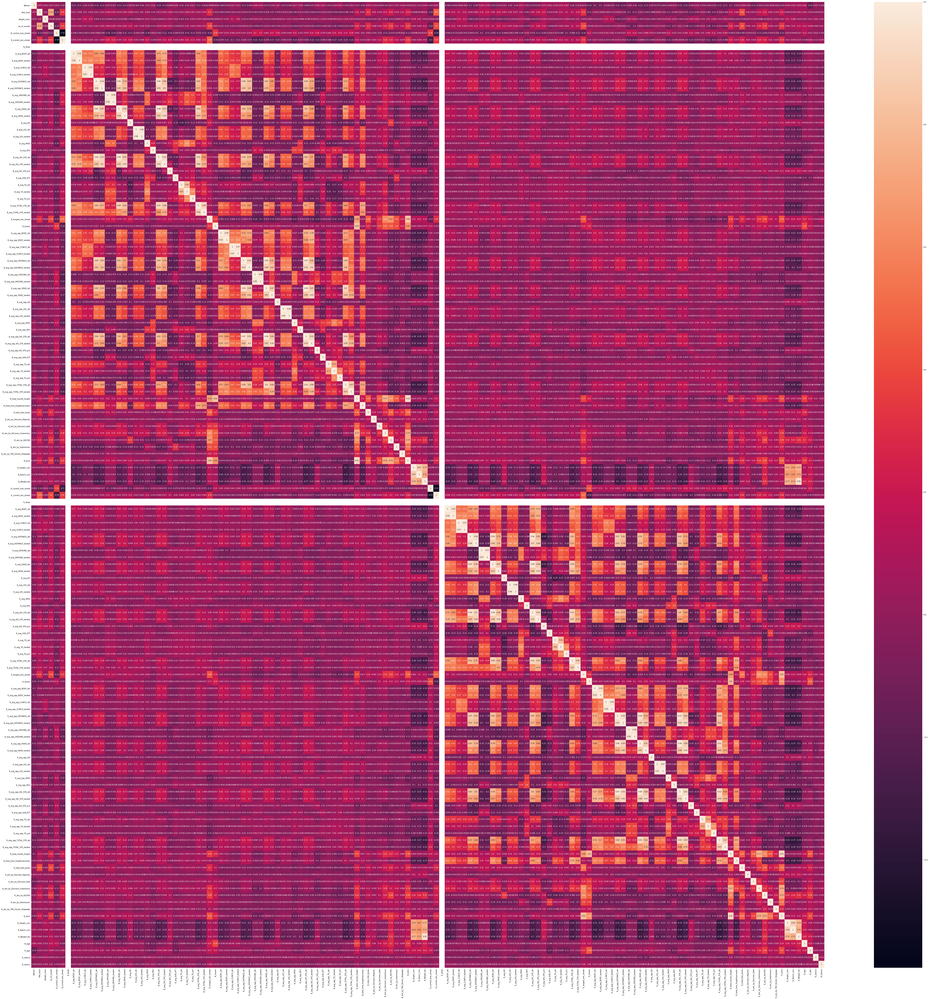

In [52]:
fig, ax = plt.subplots(figsize=(100,100))
corr_heatmap = sns.heatmap(df_cor, xticklabels=df_cor.columns, yticklabels=df_cor.columns, annot=True, ax=ax)
figure1 = corr_heatmap.get_figure()
figure1.savefig('ufc_heatmap.png')


In [53]:
df_cowboy_cor = df_cowboy.corr()

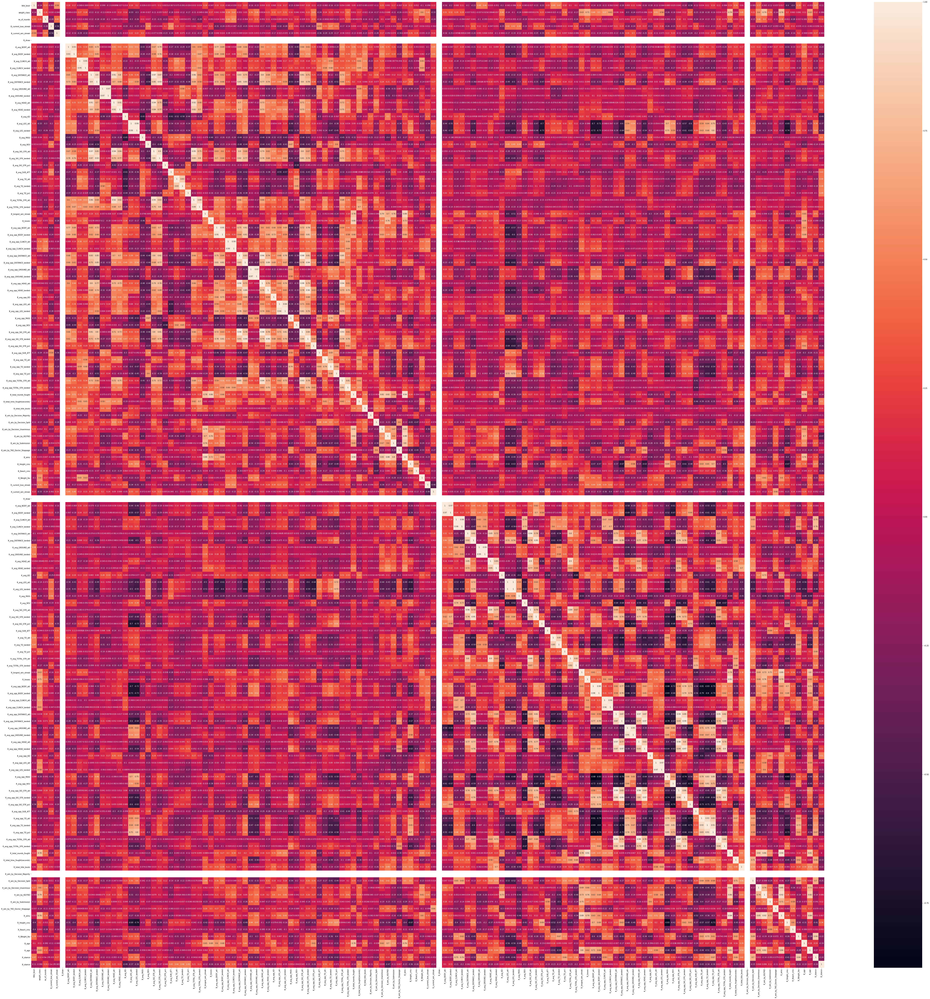

In [54]:
fig, ax = plt.subplots(figsize=(100,100))
corr_heatmap = sns.heatmap(df_cowboy_cor, xticklabels=df_cowboy_cor.columns, yticklabels=df_cowboy_cor.columns, annot=True, ax=ax)
figure1 = corr_heatmap.get_figure()
figure1.savefig('cowboy_heatmap.png')


In [55]:
df_cowboy.describe()

,weight_class,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_draw,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_KD,B_avg_LEG_att,B_avg_LEG_landed,B_avg_PASS,B_avg_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_SIG_STR_pct,B_avg_SUB_ATT,B_avg_TD_att,B_avg_TD_landed,B_avg_TD_pct,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_longest_win_streak,B_losses,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_opp_KD,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_opp_PASS,B_avg_opp_REV,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_opp_SIG_STR_pct,B_avg_opp_SUB_ATT,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_opp_TD_pct,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_total_rounds_fought,B_total_time_fought(seconds),B_total_title_bouts,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_wins,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_current_lose_streak,R_current_win_streak,R_draw,R_avg_BODY_att,R_avg_BODY_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_KD,R_avg_LEG_att,R_avg_LEG_landed,R_avg_PASS,R_avg_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_SIG_STR_pct,R_avg_SUB_ATT,R_avg_TD_att,R_avg_TD_landed,R_avg_TD_pct,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_longest_win_streak,R_losses,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_opp_KD,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_opp_PASS,R_avg_opp_REV,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_opp_SIG_STR_pct,R_avg_opp_SUB_ATT,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_opp_TD_pct,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_total_rounds_fought,R_total_time_fought(seconds),R_total_title_bouts,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age,R_stance,B_stance
count,28.000000,28.000000,28.000000,28.000000,28.0,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.0,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.0,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,6.714286,3.500000,0.285714,2.214286,0.0,11.187495,7.704422,6.733444,4.345773,67.885686,28.305043,8.2557

In [56]:
column_names

['R_fighter',
 'B_fighter',
 'Referee',
 'date',
 'location',
 'Winner',
 'title_bout',
 'weight_class',
 'no_of_rounds',
 'B_current_lose_streak',
 'B_current_win_streak',
 'B_draw',
 'B_avg_BODY_att',
 'B_avg_BODY_landed',
 'B_avg_CLINCH_att',
 'B_avg_CLINCH_landed',
 'B_avg_DISTANCE_att',
 'B_avg_DISTANCE_landed',
 'B_avg_GROUND_att',
 'B_avg_GROUND_landed',
 'B_avg_HEAD_att',
 'B_avg_HEAD_landed',
 'B_avg_KD',
 'B_avg_LEG_att',
 'B_avg_LEG_landed',
 'B_avg_PASS',
 'B_avg_REV',
 'B_avg_SIG_STR_att',
 'B_avg_SIG_STR_landed',
 'B_avg_SIG_STR_pct',
 'B_avg_SUB_ATT',
 'B_avg_TD_att',
 'B_avg_TD_landed',
 'B_avg_TD_pct',
 'B_avg_TOTAL_STR_att',
 'B_avg_TOTAL_STR_landed',
 'B_longest_win_streak',
 'B_losses',
 'B_avg_opp_BODY_att',
 'B_avg_opp_BODY_landed',
 'B_avg_opp_CLINCH_att',
 'B_avg_opp_CLINCH_landed',
 'B_avg_opp_DISTANCE_att',
 'B_avg_opp_DISTANCE_landed',
 'B_avg_opp_GROUND_att',
 'B_avg_opp_GROUND_landed',
 'B_avg_opp_HEAD_att',
 'B_avg_opp_HEAD_landed',
 'B_avg_opp_KD',
 'B_av

In [57]:
df_less_features = df.drop(['B_draw', 'R_draw','R_longest_win_streak','R_avg_opp_BODY_att',
 'R_avg_opp_BODY_landed',
 'R_avg_opp_CLINCH_att',
 'R_avg_opp_CLINCH_landed',
 'R_avg_opp_DISTANCE_att',
 'R_avg_opp_DISTANCE_landed',
 'R_avg_opp_GROUND_att',
 'R_avg_opp_GROUND_landed',
 'R_avg_opp_HEAD_att',
 'R_avg_opp_HEAD_landed',
 'R_avg_opp_KD',
 'R_avg_opp_LEG_att',
 'R_avg_opp_LEG_landed',
 'R_avg_opp_PASS',
 'R_avg_opp_REV',
 'R_avg_opp_SIG_STR_att',
 'R_avg_opp_SIG_STR_landed',
 'R_avg_opp_SIG_STR_pct',
 'R_avg_opp_SUB_ATT',
 'R_avg_opp_TD_att',
 'R_avg_opp_TD_landed',
 'R_avg_opp_TD_pct',
 'R_avg_opp_TOTAL_STR_att',
 'R_avg_opp_TOTAL_STR_landed', 'R_total_rounds_fought',
 'R_total_time_fought(seconds)',
 'R_total_title_bouts',
 'R_win_by_Decision_Majority',
 'R_win_by_Decision_Split',
 'R_win_by_Decision_Unanimous',
 'R_win_by_KO/TKO',
 'R_win_by_Submission',
 'R_win_by_TKO_Doctor_Stoppage', 'B_avg_opp_BODY_att',
 'B_avg_opp_BODY_landed',
 'B_avg_opp_CLINCH_att',
 'B_avg_opp_CLINCH_landed',
 'B_avg_opp_DISTANCE_att',
 'B_avg_opp_DISTANCE_landed',
 'B_avg_opp_GROUND_att',
 'B_avg_opp_GROUND_landed',
 'B_avg_opp_HEAD_att',
 'B_avg_opp_HEAD_landed',
 'B_avg_opp_KD',
 'B_avg_opp_LEG_att',
 'B_avg_opp_LEG_landed',
 'B_avg_opp_PASS',
 'B_avg_opp_REV',
 'B_avg_opp_SIG_STR_att',
 'B_avg_opp_SIG_STR_landed',
 'B_avg_opp_SIG_STR_pct',
 'B_avg_opp_SUB_ATT',
 'B_avg_opp_TD_att',
 'B_avg_opp_TD_landed',
 'B_avg_opp_TD_pct',
 'B_avg_opp_TOTAL_STR_att',
 'B_avg_opp_TOTAL_STR_landed',
 'B_total_rounds_fought',
 'B_total_time_fought(seconds)',
 'B_total_title_bouts',
 'B_win_by_Decision_Majority',
 'B_win_by_Decision_Split',
 'B_win_by_Decision_Unanimous',
 'B_win_by_KO/TKO',
 'B_win_by_Submission',
 'B_win_by_TKO_Doctor_Stoppage' ], axis=1)

In [52]:
df_cowboy_less = df_cowboy.drop(['B_draw', 'R_draw','R_longest_win_streak','R_avg_opp_BODY_att',
 'R_avg_opp_BODY_landed',
 'R_avg_opp_CLINCH_att',
 'R_avg_opp_CLINCH_landed',
 'R_avg_opp_DISTANCE_att',
 'R_avg_opp_DISTANCE_landed',
 'R_avg_opp_GROUND_att',
 'R_avg_opp_GROUND_landed',
 'R_avg_opp_HEAD_att',
 'R_avg_opp_HEAD_landed',
 'R_avg_opp_KD',
 'R_avg_opp_LEG_att',
 'R_avg_opp_LEG_landed',
 'R_avg_opp_PASS',
 'R_avg_opp_REV',
 'R_avg_opp_SIG_STR_att',
 'R_avg_opp_SIG_STR_landed',
 'R_avg_opp_SIG_STR_pct',
 'R_avg_opp_SUB_ATT',
 'R_avg_opp_TD_att',
 'R_avg_opp_TD_landed',
 'R_avg_opp_TD_pct',
 'R_avg_opp_TOTAL_STR_att',
 'R_avg_opp_TOTAL_STR_landed', 'R_total_rounds_fought',
 'R_total_time_fought(seconds)',
 'R_total_title_bouts',
 'R_win_by_Decision_Majority',
 'R_win_by_Decision_Split',
 'R_win_by_Decision_Unanimous',
 'R_win_by_KO/TKO',
 'R_win_by_Submission',
 'R_win_by_TKO_Doctor_Stoppage', 'B_avg_opp_BODY_att',
 'B_avg_opp_BODY_landed',
 'B_avg_opp_CLINCH_att',
 'B_avg_opp_CLINCH_landed',
 'B_avg_opp_DISTANCE_att',
 'B_avg_opp_DISTANCE_landed',
 'B_avg_opp_GROUND_att',
 'B_avg_opp_GROUND_landed',
 'B_avg_opp_HEAD_att',
 'B_avg_opp_HEAD_landed',
 'B_avg_opp_KD',
 'B_avg_opp_LEG_att',
 'B_avg_opp_LEG_landed',
 'B_avg_opp_PASS',
 'B_avg_opp_REV',
 'B_avg_opp_SIG_STR_att',
 'B_avg_opp_SIG_STR_landed',
 'B_avg_opp_SIG_STR_pct',
 'B_avg_opp_SUB_ATT',
 'B_avg_opp_TD_att',
 'B_avg_opp_TD_landed',
 'B_avg_opp_TD_pct',
 'B_avg_opp_TOTAL_STR_att',
 'B_avg_opp_TOTAL_STR_landed',
 'B_total_rounds_fought',
 'B_total_time_fought(seconds)',
 'B_total_title_bouts',
 'B_win_by_Decision_Majority',
 'B_win_by_Decision_Split',
 'B_win_by_Decision_Unanimous',
 'B_win_by_KO/TKO',
 'B_win_by_Submission',
 'B_win_by_TKO_Doctor_Stoppage' ], axis=1)

In [59]:
df_less_features_corr = df_less_features.corr()

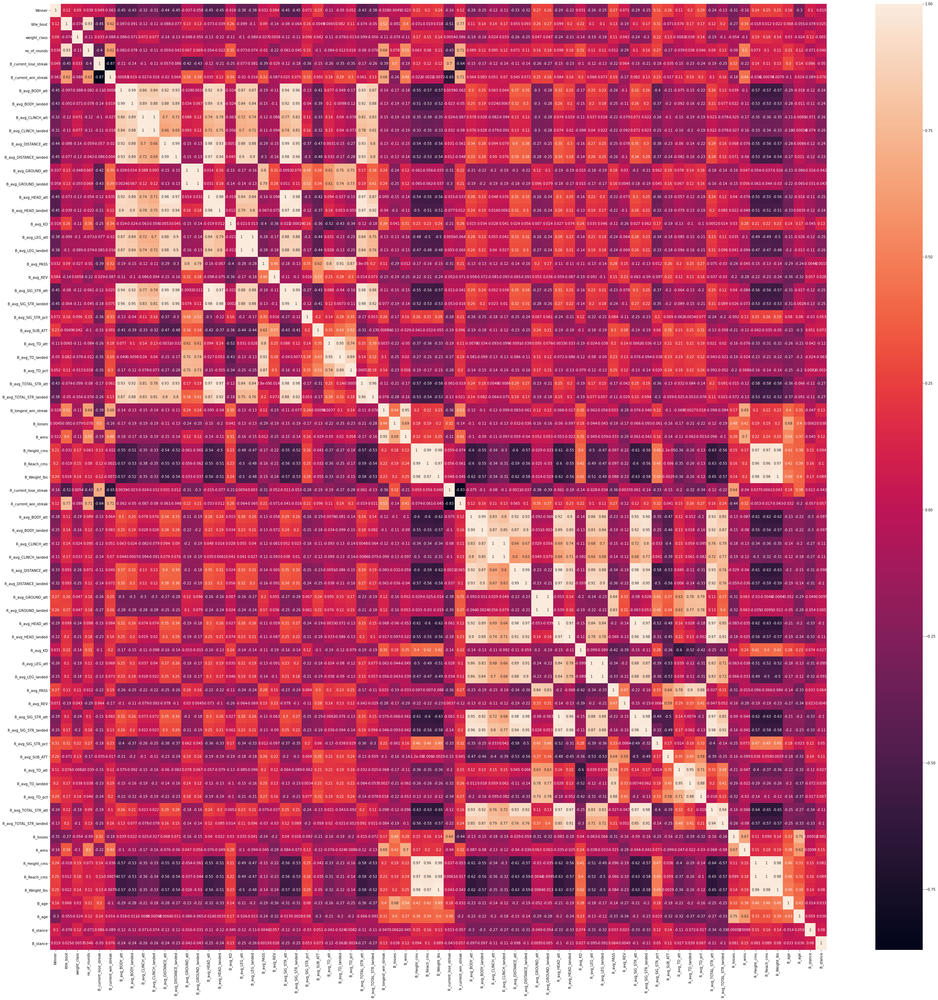

In [60]:
fig, ax = plt.subplots(figsize=(50,50))
corr_heatmap = sns.heatmap(df_less_features_corr, xticklabels=df_less_features_corr.columns, yticklabels=df_less_features_corr.columns, annot=True, ax=ax)
figure1 = corr_heatmap.get_figure()
figure1.savefig('less_feat_heatmap.png')


In [63]:
df_less_features.columns

Index(['Winner', 'title_bout', 'weight_class', 'no_of_rounds',
       'B_current_lose_streak', 'B_current_win_streak', 'B_avg_BODY_att',
       'B_avg_BODY_landed', 'B_avg_CLINCH_att', 'B_avg_CLINCH_landed',
       'B_avg_DISTANCE_att', 'B_avg_DISTANCE_landed', 'B_avg_GROUND_att',
       'B_avg_GROUND_landed', 'B_avg_HEAD_att', 'B_avg_HEAD_landed',
       'B_avg_KD', 'B_avg_LEG_att', 'B_avg_LEG_landed', 'B_avg_PASS',
       'B_avg_REV', 'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed',
       'B_avg_SIG_STR_pct', 'B_avg_SUB_ATT', 'B_avg_TD_att', 'B_avg_TD_landed',
       'B_avg_TD_pct', 'B_avg_TOTAL_STR_att', 'B_avg_TOTAL_STR_landed',
       'B_longest_win_streak', 'B_losses', 'B_wins', 'B_Height_cms',
       'B_Reach_cms', 'B_Weight_lbs', 'R_current_lose_streak',
       'R_current_win_streak', 'R_avg_BODY_att', 'R_avg_BODY_landed',
       'R_avg_CLINCH_att', 'R_avg_CLINCH_landed', 'R_avg_DISTANCE_att',
       'R_avg_DISTANCE_landed', 'R_avg_GROUND_att', 'R_avg_GROUND_landed',
       'R_avg

In [53]:
df_cowboy_less_cor = df_cowboy_less.corr()

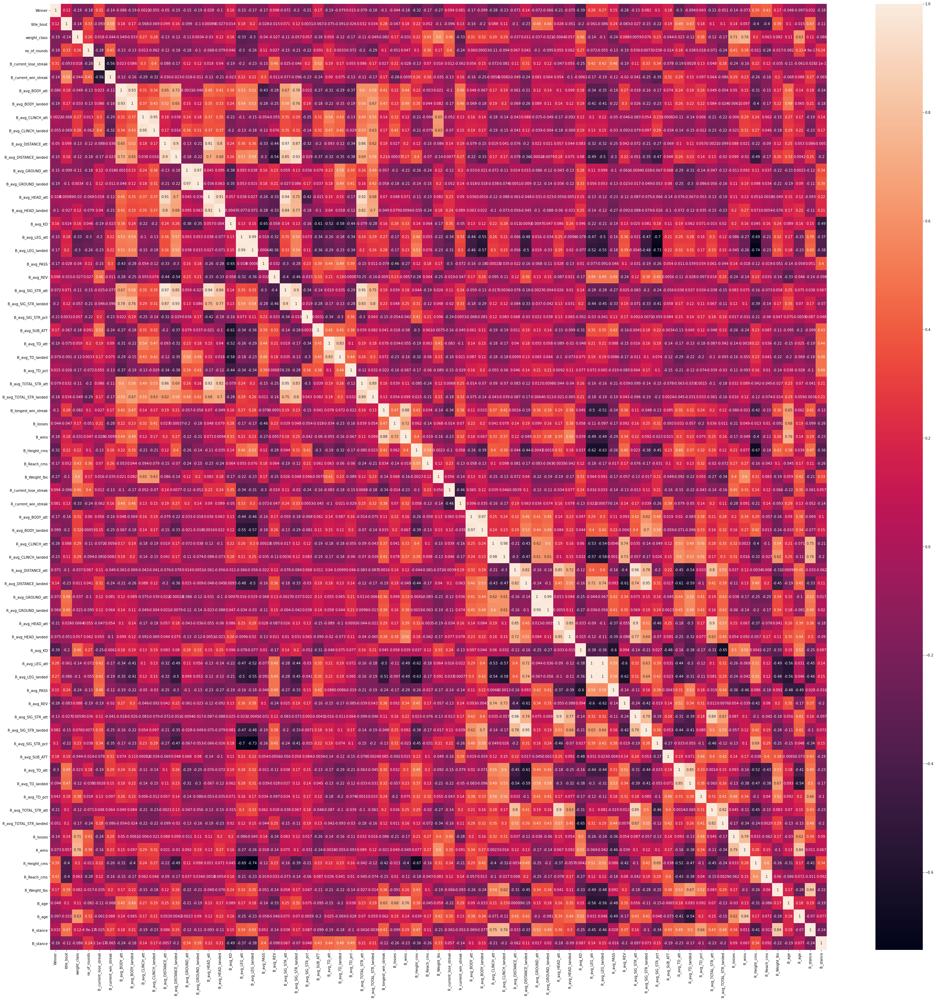

In [56]:
fig, ax = plt.subplots(figsize=(50,50))
corr_heatmap = sns.heatmap(df_cowboy_less_cor, xticklabels=df_cowboy_less_cor.columns, yticklabels=df_cowboy_less_cor.columns, annot=True, ax=ax)
figure1 = corr_heatmap.get_figure()
figure1.savefig('cowboy_less_feat_heatmap.png')


In [58]:
df_cowboy.to_csv('Cowboy_fights')

In [59]:
df.to_csv('Cleaned_fights')

In [60]:
df_less_features.to_csv('Cleaned_fights2')